In [3]:
import csv
import os

import matplotlib.pyplot as plt
import librosa
import numpy as np
from IPython.display import Audio, display

import ruptures as rpt  # our package

In [4]:
def fig_ax(figsize=(15, 5), dpi=150):
    """Return a (matplotlib) figure and ax objects with given size."""
    return plt.subplots(figsize=figsize, dpi=dpi)

In [5]:
duration = 400  # in seconds
signal, sampling_rate = librosa.load(r"C:\Users\anbom\Downloads\Emmanuel songs\72. Vitalic - And it Goes Like.flac", duration=duration)

# listen to the music
display(Audio(data=signal, rate=sampling_rate))

# look at the envelope
fig, ax = fig_ax()
ax.plot(np.arange(signal.size) / sampling_rate, signal)
ax.set_xlim(0, signal.size / sampling_rate)
ax.set_xlabel("Time (s)")
_ = ax.set(title="Sound envelope")

C:\Users\nield\AppData\Local\Temp\ipykernel_25616\1624380198.py:2: UserWarning: PySoundFile failed. Trying audioread instead.
  signal, sampling_rate = librosa.load(r"", duration=duration)
C:\Users\nield\anaconda3\envs\Music\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


FileNotFoundError: [Errno 2] No such file or directory: ''

In [1]:
# Compute the onset strength
hop_length_tempo = 256
oenv = librosa.onset.onset_strength(
    y=signal, sr=sampling_rate, hop_length=hop_length_tempo
)
# Compute the tempogram
tempogram = librosa.feature.tempogram(
    onset_envelope=oenv,
    sr=sampling_rate,
    hop_length=hop_length_tempo,
)
# Display the tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    hop_length=hop_length_tempo,
    sr=sampling_rate,
    x_axis="s",
    y_axis="tempo",
)

NameError: name 'librosa' is not defined

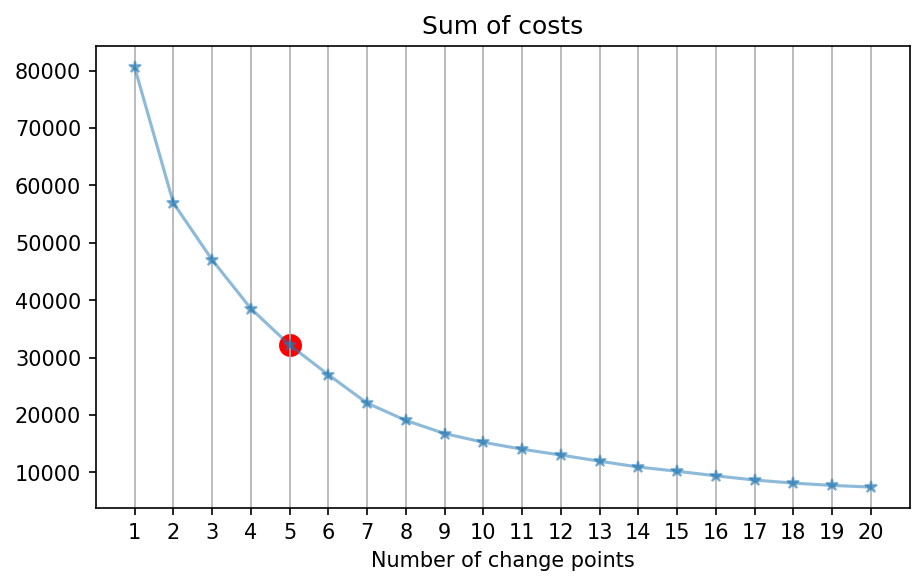

In [117]:
# Choose detection method
algo = rpt.KernelCPD(kernel="linear").fit(tempogram.T)

# Choose the number of changes (elbow heuristic)
n_bkps_max = 20  # K_max
# Start by computing the segmentation with most changes.
# After start, all segmentations with 1, 2,..., K_max-1 changes are also available for free.
_ = algo.predict(n_bkps_max)

array_of_n_bkps = np.arange(1, n_bkps_max + 1)


def get_sum_of_cost(algo, n_bkps) -> float:
    """Return the sum of costs for the change points `bkps`"""
    bkps = algo.predict(n_bkps=n_bkps)
    return algo.cost.sum_of_costs(bkps)


fig, ax = fig_ax((7, 4))
ax.plot(
    array_of_n_bkps,
    [get_sum_of_cost(algo=algo, n_bkps=n_bkps) for n_bkps in array_of_n_bkps],
    "-*",
    alpha=0.5,
)
ax.set_xticks(array_of_n_bkps)
ax.set_xlabel("Number of change points")
ax.set_title("Sum of costs")
ax.grid(axis="x")
ax.set_xlim(0, n_bkps_max + 1)

# Visually we choose n_bkps=5 (highlighted in red on the elbow plot)
n_bkps = 5
_ = ax.scatter([5], [get_sum_of_cost(algo=algo, n_bkps=5)], color="r", s=100)

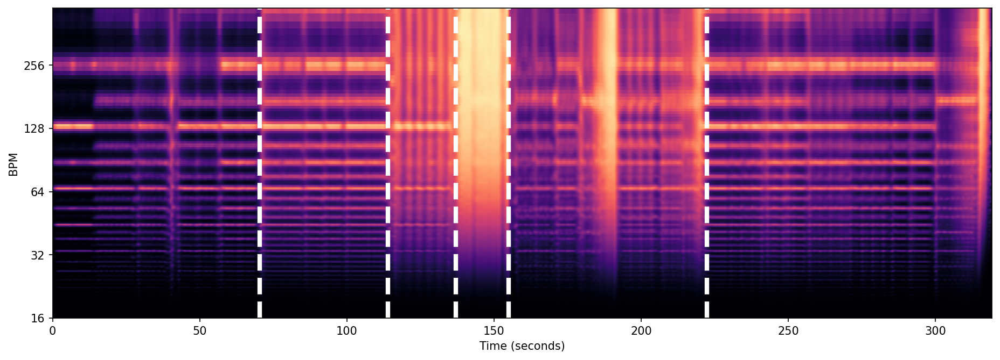

In [118]:
# Segmentation
bkps = algo.predict(n_bkps=n_bkps)
# Convert the estimated change points (frame counts) to actual timestamps
bkps_times = librosa.frames_to_time(bkps, sr=sampling_rate, hop_length=hop_length_tempo)

# Displaying results
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    x_axis="s",
    y_axis="tempo",
    hop_length=hop_length_tempo,
    sr=sampling_rate,
)

for b in bkps_times[:-1]:
    ax.axvline(b, ls="--", color="white", lw=4)

In [119]:
# Compute change points corresponding indexes in original signal
bkps_time_indexes = (sampling_rate * bkps_times).astype(int).tolist()

for segment_number, (start, end) in enumerate(
    rpt.utils.pairwise([0] + bkps_time_indexes), start=1
):
    segment = signal[start:end]
    print(f"Segment n°{segment_number} (duration: {segment.size/sampling_rate:.2f} s)")
    display(Audio(data=segment, rate=sampling_rate))

# Create output directory
output_dir = "DO NOT TOUCH/Vitallic/Ruptures_segmented_audio_csv"
os.makedirs(output_dir, exist_ok=True)

csv_data = []  # Store all segments

for segment_number, (start, end) in enumerate(rpt.utils.pairwise([0] + bkps_time_indexes), start=1):
    segment = signal[start:end]
    start_time = start / sampling_rate
    duration = (end - start) / sampling_rate
    label = f"Segment {segment_number}"

    # Append data to list
    csv_data.append({
        "TIME": start_time,
        "VALUE": segment_number,
        "DURATION": duration,
        "LABEL": label,
    })

    # Save all segment data to a single CSV file
    all_csv_filename = os.path.join(output_dir, "all_segments_song_72.csv")
    with open(all_csv_filename, mode='w', newline='') as file:
        writer = csv.DictWriter(file, fieldnames=["TIME", "VALUE", "DURATION", "LABEL"])
        writer.writeheader()
        writer.writerows(csv_data)  # Wrap in list to avoid errors

    print(f"Segment {segment_number} saved to {all_csv_filename}")

Segment n°1 (duration: 70.29 s)


Segment n°2 (duration: 43.58 s)


Segment n°3 (duration: 23.19 s)


Segment n°4 (duration: 17.97 s)


Segment n°5 (duration: 67.24 s)


Segment n°6 (duration: 96.96 s)


Segment 1 saved to Ruptures_segmented_audio_csv\all_segments_song_72.csv
Segment 2 saved to Ruptures_segmented_audio_csv\all_segments_song_72.csv
Segment 3 saved to Ruptures_segmented_audio_csv\all_segments_song_72.csv
Segment 4 saved to Ruptures_segmented_audio_csv\all_segments_song_72.csv
Segment 5 saved to Ruptures_segmented_audio_csv\all_segments_song_72.csv
Segment 6 saved to Ruptures_segmented_audio_csv\all_segments_song_72.csv
